In [4]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
import matplotlib.pyplot as plt

In [6]:
from argparse import Namespace
from pathlib import Path
import torch
from pytorch_lightning.trainer import Trainer, seed_everything
from pytorch_lightning.callbacks import EarlyStopping, ModelCheckpoint

from turboflow.dataloaders import TurboFlowDataModule
from turboflow.evaluation import compute_all_metrics

from turboflow.utils import phy_utils as phy
from turboflow.utils import torch_utils as tch

In [7]:
seed_everything(42, workers=True)

Global seed set to 42


42

In [38]:
# load dataset
data_dir = Path('/','home','dicarlo_d','Documents','Datasets','Turb2D.hdf5')
dm = TurboFlowDataModule(dataset='Turb2D', 
                         data_dir=data_dir,
                         batch_size=100000,
                         time_idx=0,
                         train_downsampling=4,
                         val_downsampling=4,
                         test_downsampling=1,
                         num_workers=1)
dm.setup()

In [39]:
X_lr, y_lr = dm.val_dataset[:]
img_shape_lr = dm.val_dataset.img_shape[:2]
shape_lr = dm.val_dataset.img_shape
L = shape_lr[0]
N_lr = X_lr.shape[0]
print(N_lr, L)

X_hr, y_hr = dm.test_dataset[:]
img_shape_hr = dm.test_dataset.img_shape[:2]
shape_hr = dm.test_dataset.img_shape
H = shape_hr[0]
N_hr = X_hr.shape[0]
print(N_hr, H)

4096 64
65536 256


In [73]:
from turboflow.models.phyrff_hard import plDivFreeRFFNet

# choose the hyperparams
hparams = {
    'name':'RFFNet',
    'mlp_layers_num': 5,
    'mlp_layers_dim': 256, 
    'mlp_last_actfn': 'tanh',
    'do_rff': True, 
    'rff_num': 1024, 
    'rff_scale': 10,
    'do_divfree': False,
    'lam_pde':  0,     # soft constr. grad(u,v)=0
    'lam_sdiv': 1e-3,     # spatial grad(u,v) = torch.autograd(u,v)
    'lam_sfn':  1e-3,     # offgrid L2 reg. on Sfun
    'lam_spec': 0,    # L2 diff on the spectrum
    'lam_grads':1e-3,    # offrgid L2 reg. on grad and autograd
    'lam_weight': 1e-4,  # L2 reg on the NN's weights
    'sfn_min_x': 1./256., # maximal resolution
    'sfn_num_centers': 32,
    'sfn_num_increments':3,
    'sfn_patch_dim': 16 # (P/2)
}

model = plDivFreeRFFNet(**vars(Namespace(**hparams)))

In [74]:
early_stop_callback = EarlyStopping(monitor='val/loss/tot')
checkpoint_callback = ModelCheckpoint(
    monitor="val/loss/tot",
    dirpath=".torch_checkpoints",
    filename="Turb2D-%s-{epoch:02d}-{val_loss:.2f}" % (hparams['name']),
    save_top_k=1,
    mode="min",
)

trainer = Trainer(gpus=1,
                  max_epochs=3000, 
                  log_every_n_steps=20,
                  check_val_every_n_epoch=20, 
                  callbacks=[early_stop_callback,
                             checkpoint_callback])


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs


/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/core/datamodule.py:423: LightningDeprecationWarning: DataModule.setup has already been called, so it will not be called again. In v1.6 this behavior will change to always call DataModule.setup.
  rank_zero_deprecation(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type            | Params
--------------------------------------------
0 | rff     | Fourier         | 2.0 K 
1 | mlp     | MLP             | 788 K 
2 | mtl     | MTL             | 4     
3 | sp_grad | SpatialGradient | 0     
--------------------------------------------
788 K     Trainable params
2.0 K     Non-trainable params
790 K     Total params
3.161     Total estimated model params size (MB)


Validation sanity check: 0it [00:00, ?it/s]

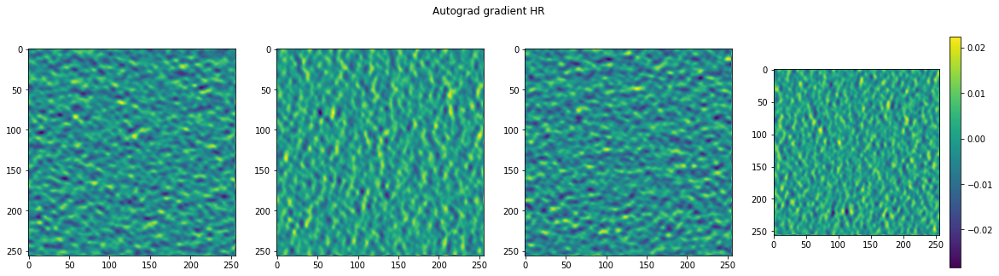

1.5092089142854093e-06 1.2324778708716622e-06 1.9640885966509813e-06 2.9318662200239487e-06


Global seed set to 42
/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/trainer/data_loading.py:105: UserWarning: The dataloader, train dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 48 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  rank_zero_warn(
/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/pytorch_lightning/trainer/data_loading.py:326: UserWarning: The number of training samples (1) is smaller than the logging interval Trainer(log_every_n_steps=20). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Training: -1it [00:00, ?it/s]

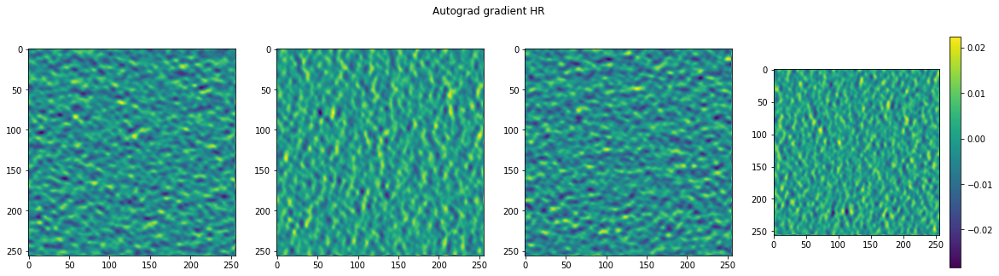

1.5092089142854093e-06 1.2324778708716622e-06 1.9640885966509813e-06 2.9318662200239487e-06
2.4385531105508562e-06 2.4640253286634106e-06 4.752170752908569e-06 6.069424671295565e-06
3.3465632895968156e-06 4.158398041909095e-06 6.855579158582259e-06 2.1113286493346095e-05
3.967472366639413e-06 5.9593230616883375e-06 5.907972990826238e-06 2.986403342220001e-05
4.923738288198365e-06 8.836695087666158e-06 5.12972201249795e-06 3.5882996598957106e-05
1.0417435987619683e-05 1.3691883395949844e-05 8.668810551171191e-06 4.52837957709562e-05
2.211057835665997e-05 2.180181945732329e-05 1.6065336239989847e-05 5.7248609664384276e-05
3.874765388900414e-05 3.5684406611835584e-05 2.581449007266201e-05 7.461705536115915e-05
5.5554239224875346e-05 5.1806968258460984e-05 3.811117130680941e-05 9.813653741730377e-05
6.844662129878998e-05 6.839744310127571e-05 5.481667903950438e-05 0.00013034600124228746


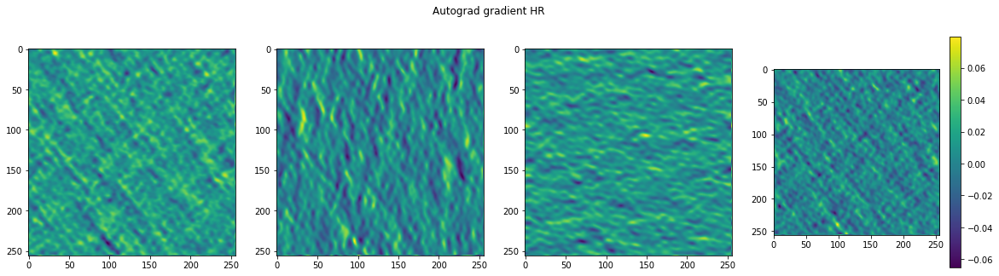

7.293944509001449e-05 8.134088420774788e-05 7.149012526497245e-05 0.00015969682135619223
7.608330633956939e-05 9.493021934758872e-05 8.715472358744591e-05 0.00017986774037126452
7.995674241101369e-05 0.0001088818971766159 9.736833453644067e-05 0.0001867306127678603
7.999592344276607e-05 0.0001151889591710642 9.985192446038127e-05 0.0001810968533391133
7.008310058154166e-05 0.00010637807281455025 9.409709309693426e-05 0.00016752271039877087
5.624796176562086e-05 9.004076855489984e-05 8.634568803245202e-05 0.0001520599180366844
4.3854102841578424e-05 7.47002413845621e-05 7.681285933358595e-05 0.00013313560339156538
3.516681681503542e-05 6.426660547731444e-05 6.73672475386411e-05 0.00011357707990100607
2.9501374228857458e-05 5.8011461078422144e-05 6.112102710176259e-05 9.867964399745688e-05
2.5654157070675865e-05 5.40812143299263e-05 5.910420441068709e-05 9.044947364600375e-05


Validating: 0it [00:00, ?it/s]

2.283778303535655e-05 5.137801053933799e-05 6.0895697970408946e-05 8.816230547381565e-05


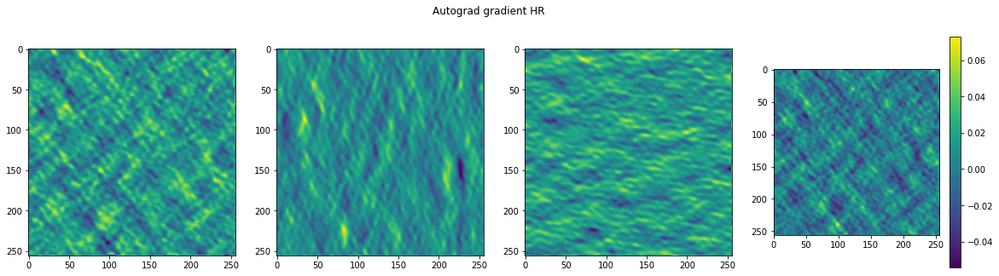

2.283778303535655e-05 5.137801053933799e-05 6.0895697970408946e-05 8.816230547381565e-05
2.0729774405481294e-05 4.9592836148804054e-05 6.459882570197806e-05 8.85648769326508e-05
1.941057780641131e-05 4.828939927392639e-05 6.762080738553777e-05 8.686349610798061e-05
1.8995069694938138e-05 4.754995825351216e-05 6.764630234101787e-05 8.076134690782055e-05
1.8677146726986393e-05 4.636946687242016e-05 6.483185279648751e-05 7.217225356725976e-05
1.7891226889332756e-05 4.329602234065533e-05 6.11459108768031e-05 6.339574611047283e-05
1.6847436199896038e-05 3.934597407351248e-05 5.8410449128132313e-05 5.64099864277523e-05
1.5926474588923156e-05 3.574814763851464e-05 5.5950364185264334e-05 5.067344682174735e-05
1.5640760466339998e-05 3.449425639701076e-05 5.497908568941057e-05 4.745865589939058e-05
1.560272903589066e-05 3.429427306400612e-05 5.443581540021114e-05 4.407222513691522e-05


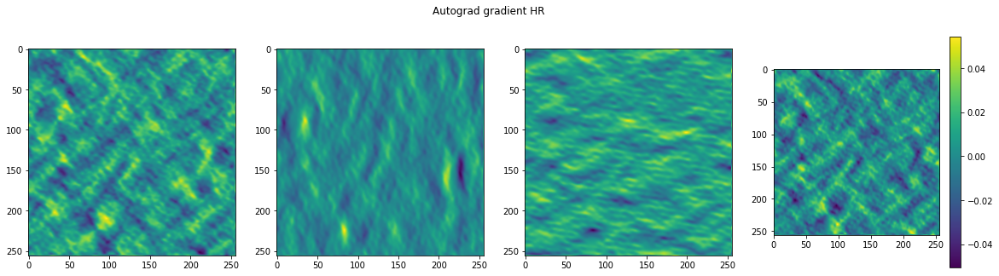

1.5521949535468593e-05 3.4593696909723803e-05 5.440777022158727e-05 4.119096411159262e-05
1.5073962458700407e-05 3.492434188956395e-05 5.548318586079404e-05 3.9238177123479545e-05
1.4102608474786393e-05 3.4623903047759086e-05 5.698557652067393e-05 3.738551095011644e-05
1.2964525922143366e-05 3.4219010558445007e-05 5.7613986427895725e-05 3.477011705399491e-05
1.186819099530112e-05 3.3799096854636446e-05 5.7059751270571724e-05 3.159496918669902e-05
1.0971760275424458e-05 3.44065556419082e-05 5.6116634368663654e-05 2.9702649044338614e-05
1.0182133337366395e-05 3.553094938979484e-05 5.645325654768385e-05 2.9274338885443285e-05
9.672196938481648e-06 3.660060610854998e-05 5.715627776226029e-05 2.909840077336412e-05
9.32335478864843e-06 3.789319089264609e-05 5.828589928569272e-05 3.048444887099322e-05
8.846036507748067e-06 3.864786776830442e-05 5.7404671679250896e-05 3.028924038517289e-05


Validating: 0it [00:00, ?it/s]

8.495939255226403e-06 3.877254494000226e-05 5.591952140093781e-05 2.936554119514767e-05


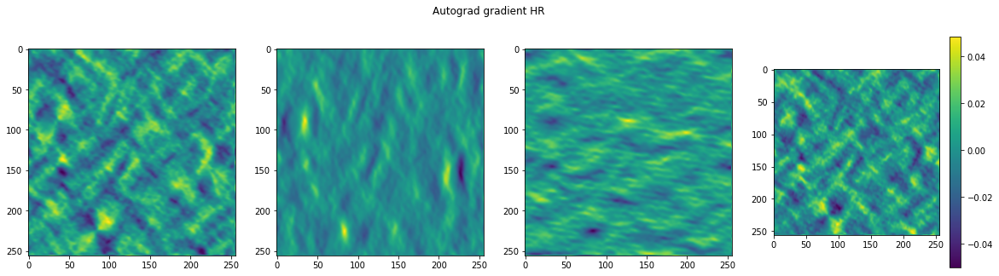

8.495939255226403e-06 3.877254494000226e-05 5.591952140093781e-05 2.936554119514767e-05
8.32650221127551e-06 3.837272015516646e-05 5.567734478972852e-05 2.831129495461937e-05
8.086595698841847e-06 3.73818475054577e-05 5.606040940620005e-05 2.725974627537653e-05
7.813892807462253e-06 3.625696990638971e-05 5.674559361068532e-05 2.602028507681098e-05
7.680702765355818e-06 3.538470991770737e-05 5.611027518170886e-05 2.4067832782748155e-05
7.678450856474228e-06 3.439742067712359e-05 5.475121724884957e-05 2.1986155843478628e-05
7.691566679568496e-06 3.311425825813785e-05 5.474487988976762e-05 2.055203185591381e-05
7.685302080062684e-06 3.1578736525261775e-05 5.53856480109971e-05 1.9633092961157672e-05
7.6248702498560306e-06 3.026714148290921e-05 5.657660949509591e-05 1.896177673188504e-05
7.4801346272579394e-06 3.3414708013879135e-05 5.613130269921385e-05 1.7715947251417674e-05


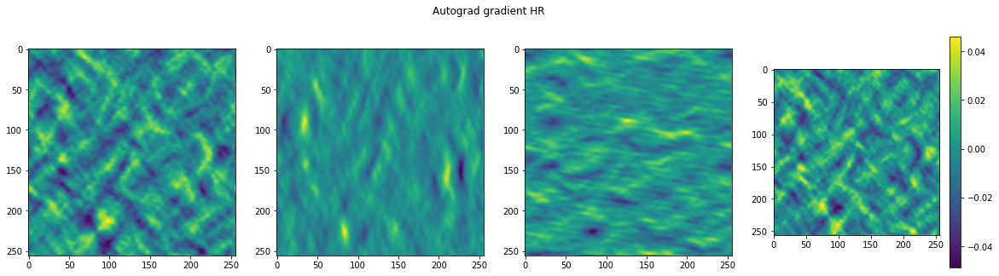

7.337840088439407e-06 3.7156190956011415e-05 5.411007805378176e-05 1.594905916135758e-05
7.051590728224255e-06 3.986872616223991e-05 5.16379477630835e-05 1.4216519048204646e-05
6.6932293520949315e-06 4.4314569095149636e-05 4.9986920203082263e-05 1.2997505109524354e-05
6.4887221924436744e-06 4.840191832045093e-05 4.996971256332472e-05 1.2803712706954684e-05
6.869562184874667e-06 5.249842433840968e-05 5.210020754020661e-05 1.341612369287759e-05
7.3831774898280855e-06 5.678880916093476e-05 5.409469304140657e-05 1.4366121831699274e-05
7.695035492361058e-06 5.927182064624503e-05 5.319187039276585e-05 1.4414536963158753e-05
7.873720278439578e-06 5.958200563327409e-05 5.1127928600180894e-05 1.3978520655655302e-05
7.62004265197902e-06 5.7548128097550943e-05 4.8854853957891464e-05 1.3454266991175245e-05
6.9697648541477975e-06 5.462274930323474e-05 4.704879393102601e-05 1.3002423656871542e-05


Validating: 0it [00:00, ?it/s]

6.665903129032813e-06 5.269188113743439e-05 4.623281711246818e-05 1.2862693438364659e-05


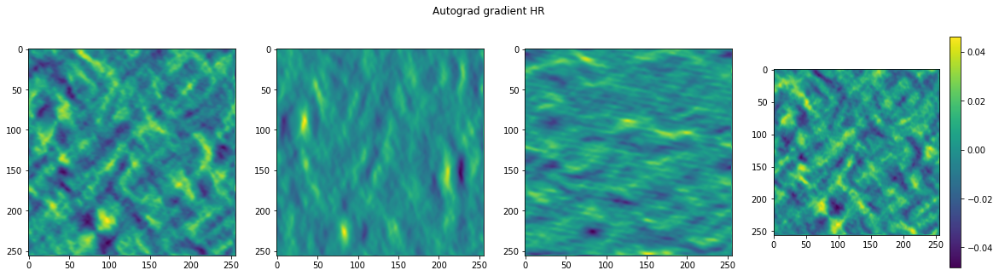

6.665903129032813e-06 5.269188113743439e-05 4.623281711246818e-05 1.2862693438364659e-05
6.654648586845724e-06 5.17167427460663e-05 4.6549819671781734e-05 1.2979427992831916e-05


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7efa89cdb790>
Traceback (most recent call last):
  File "/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1328, in __del__
    self._shutdown_workers()
  File "/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


6.490514351753518e-06 5.2413277444429696e-05 4.637146776076406e-05 1.2886880540463608e-05


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7efa89cdb790>
Traceback (most recent call last):
  File "/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1328, in __del__
    self._shutdown_workers()
  File "/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


6.311248398560565e-06 5.275234434520826e-05 4.6674809709656984e-05 1.2803319805243518e-05


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7efa89cdb790>
Traceback (most recent call last):
  File "/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1328, in __del__
    self._shutdown_workers()
  File "/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


6.2016324591240846e-06 5.224764026934281e-05 4.7986002755351365e-05 1.2966201211384032e-05
6.108041816332843e-06 5.1223181799286976e-05 5.091471393825486e-05 1.2241897820786107e-05
6.014216523908544e-06 5.010972381569445e-05 5.270852489047684e-05 1.1467556760180742e-05
5.8571990848577116e-06 4.838603126700036e-05 5.335218884283677e-05 1.089550551114371e-05
5.446887371363118e-06 4.6554272557841614e-05 5.427770520327613e-05 1.0604250746837351e-05


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7efa89cdb790>
Traceback (most recent call last):
  File "/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1328, in __del__
    self._shutdown_workers()
  File "/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


5.09164783579763e-06 4.486676334636286e-05 5.5920478189364076e-05 1.068133678927552e-05


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7efa89cdb790>
Traceback (most recent call last):
  File "/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1328, in __del__
    self._shutdown_workers()
  File "/home/dicarlo_d/Documents/Code/TurboSuperResultion/venv/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1320, in _shutdown_workers
    if w.is_alive():
  File "/usr/lib/python3.8/multiprocessing/process.py", line 160, in is_alive
    assert self._parent_pid == os.getpid(), 'can only test a child process'
AssertionError: can only test a child process


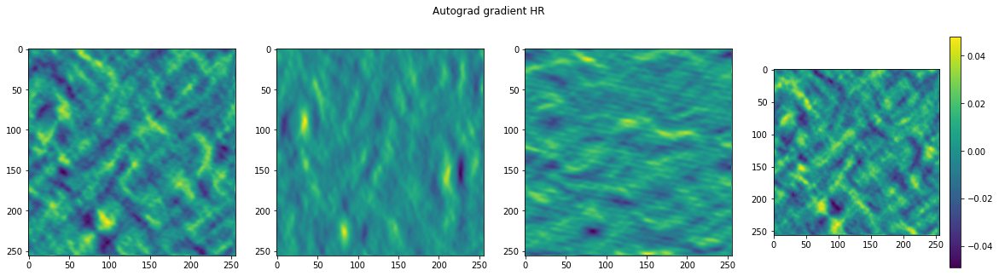

4.833727871300653e-06 4.3020878365496174e-05 5.7513163483235985e-05 1.1503252608235925e-05
4.739471933135064e-06 4.189864557702094e-05 5.80734595132526e-05 1.1876507414854132e-05
4.813870873476844e-06 4.121409438084811e-05 5.8447298215469345e-05 1.1684064702421892e-05
4.916177203995176e-06 4.019449625047855e-05 5.815859549329616e-05 1.1667963917716406e-05
4.761619948112639e-06 3.7992544093867764e-05 5.623393371934071e-05 1.1327295396768022e-05
4.51497498943354e-06 3.5084762203041464e-05 5.3108080464880913e-05 1.0855131222342607e-05
4.367359906609636e-06 3.271676177973859e-05 5.079760740045458e-05 1.0489359738130588e-05
4.290622200642247e-06 3.14071039611008e-05 4.9158385081682354e-05 1.0167616892431397e-05
4.3052787077613175e-06 3.0916748073650524e-05 4.9387475883122534e-05 1.0088465387525503e-05
4.330455340095796e-06 3.084429772570729e-05 5.0962422392331064e-05 1.0239687071589287e-05


Validating: 0it [00:00, ?it/s]

4.27115583079285e-06 3.122685302514583e-05 5.236173092271201e-05 1.0342535460949875e-05


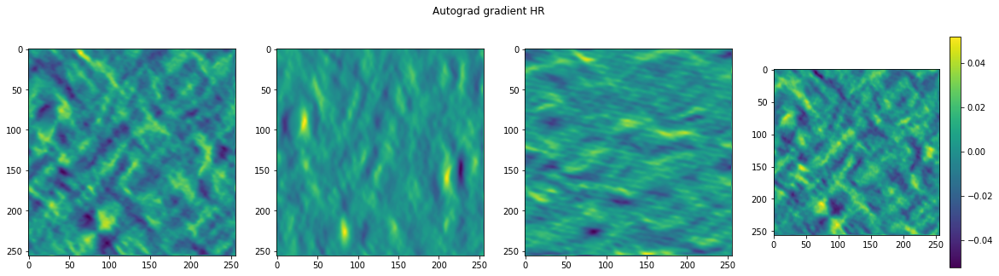

4.27115583079285e-06 3.122685302514583e-05 5.236173092271201e-05 1.0342535460949875e-05
4.2705646592366975e-06 3.131127232336439e-05 5.1432911277515814e-05 9.739489541971125e-06
4.347721187514253e-06 3.0925326427677646e-05 4.915105091640726e-05 9.003807463159319e-06
4.264633389539085e-06 2.9559669201262295e-05 4.7079010982997715e-05 8.367553164134733e-06
4.078508027305361e-06 2.811111517075915e-05 4.6166904212441295e-05 8.082514796114992e-06
4.406700099934824e-06 2.7528598366188817e-05 4.64958866359666e-05 8.090240953606553e-06
4.862344212597236e-06 2.7999736630590633e-05 4.5920853153802454e-05 7.983595423866063e-06
4.893330242339289e-06 2.8029931854689494e-05 4.595737118506804e-05 7.998542059795e-06
4.897756298305467e-06 2.7966269044554792e-05 4.590070602716878e-05 8.004507435543928e-06
4.887118848273531e-06 2.7880201741936617e-05 4.591301694745198e-05 8.01610713097034e-06


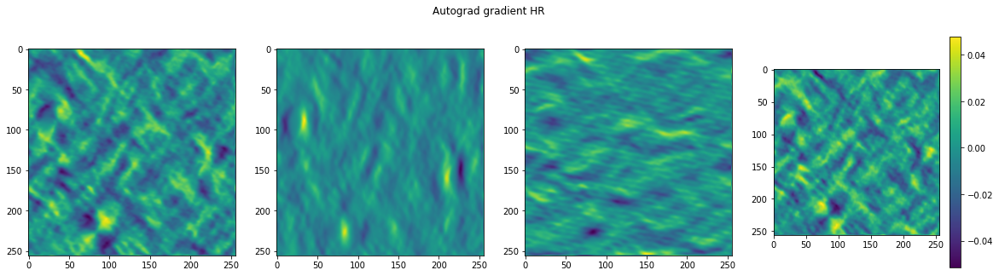

4.866690233029658e-06 2.781374496407807e-05 4.599134990712628e-05 8.040984539547935e-06
4.832912964047864e-06 2.7794594643637538e-05 4.610381438396871e-05 8.128996341838501e-06
4.786496447195532e-06 2.7765681807068177e-05 4.6177687181625515e-05 8.198101568268612e-06
4.721685399999842e-06 2.7794381821877323e-05 4.619904575520195e-05 8.254396561824251e-06
4.647504283639137e-06 2.7886837415280752e-05 4.618953971657902e-05 8.309408258355688e-06
4.569851626001764e-06 2.7984846383333206e-05 4.6347598981810734e-05 8.368533599423245e-06
4.492192147154128e-06 2.838406726368703e-05 4.6389439376071095e-05 8.396883458772209e-06
4.417493073560763e-06 2.8732245482387953e-05 4.6321139961946756e-05 8.397169949603267e-06
4.35356241723639e-06 2.9056160201434977e-05 4.619634273694828e-05 8.384979992115404e-06
4.2992023736587726e-06 2.933386895165313e-05 4.606334550771862e-05 8.365219400729984e-06


Validating: 0it [00:00, ?it/s]

4.258349235897185e-06 2.962797589134425e-05 4.59455513919238e-05 8.343394256371539e-06


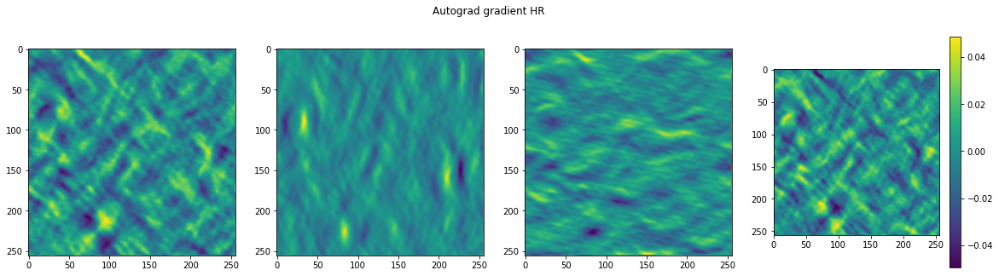

4.258349235897185e-06 2.962797589134425e-05 4.59455513919238e-05 8.343394256371539e-06
4.224200438329717e-06 2.9831080610165372e-05 4.591666584019549e-05 8.318213076563552e-06
4.176440597802866e-06 3.021394513780251e-05 4.595055361278355e-05 8.304870789288543e-06
4.122298378206324e-06 3.052582542295568e-05 4.61158633697778e-05 8.322398571181111e-06
4.069761416758411e-06 3.083863703068346e-05 4.6299726818688214e-05 8.372384399990551e-06
4.011278178950306e-06 3.1077048333827406e-05 4.6469409426208586e-05 8.422223800153006e-06
3.950325208279537e-06 3.129206379526295e-05 4.6633427700726315e-05 8.455181159661151e-06
3.893089342454914e-06 3.145001392113045e-05 4.679300764109939e-05 8.494143912685104e-06
3.856057446682826e-06 3.1674917408963665e-05 4.7051216824911535e-05 8.538800102542154e-06
3.852797362924321e-06 3.1690440664533526e-05 4.707273910753429e-05 8.541628631064668e-06


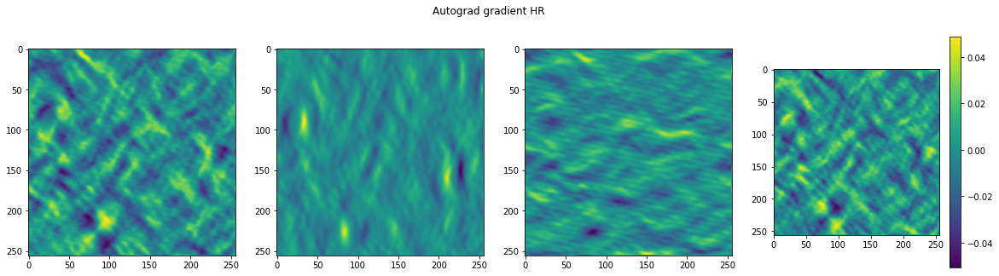

3.8491612031066325e-06 3.169702904415317e-05 4.708078995463438e-05 8.54160407470772e-06
3.846065737889148e-06 3.169849151163362e-05 4.7083325625862926e-05 8.54053723742254e-06
3.842344540316844e-06 3.169195770169608e-05 4.707935659098439e-05 8.538311703887302e-06
3.8404255064961035e-06 3.1690353353042156e-05 4.708470805780962e-05 8.537662324670237e-06
3.838095381070161e-06 3.169084811815992e-05 4.7107769205467775e-05 8.537892426829785e-06
3.835901225102134e-06 3.1686537113273516e-05 4.712751251645386e-05 8.537876965419855e-06
3.833851224044338e-06 3.167933755321428e-05 4.714296665042639e-05 8.536624591215514e-06
3.831538379017729e-06 3.166668102494441e-05 4.714581882581115e-05 8.532988431397825e-06
3.830006789939944e-06 3.165426824125461e-05 4.7150024329312146e-05 8.528621947334614e-06
3.827945420198375e-06 3.1637064239475876e-05 4.7143672418314964e-05 8.522417374479119e-06


In [ ]:
trainer.fit(model, dm)

tensor([0.0000, 0.0156, 0.0312, 0.0469, 0.0625, 0.0781, 0.0938, 0.1094, 0.1250,
        0.1406, 0.1562, 0.1719, 0.1875, 0.2031, 0.2188, 0.2344, 0.2500, 0.2656,
        0.2812, 0.2969, 0.3125, 0.3281, 0.3438, 0.3594, 0.3750, 0.3906, 0.4062,
        0.4219, 0.4375, 0.4531, 0.4688, 0.4844, 0.5000, 0.5156, 0.5312, 0.5469,
        0.5625, 0.5781, 0.5938, 0.6094, 0.6250, 0.6406, 0.6562, 0.6719, 0.6875,
        0.7031, 0.7188, 0.7344, 0.7500, 0.7656, 0.7812, 0.7969, 0.8125, 0.8281,
        0.8438, 0.8594, 0.8750, 0.8906, 0.9062, 0.9219, 0.9375, 0.9531, 0.9688,
        0.9844])
torch.Size([4096, 2])


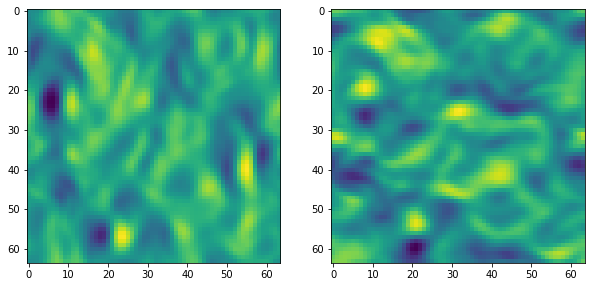

torch.Size([4096, 2])


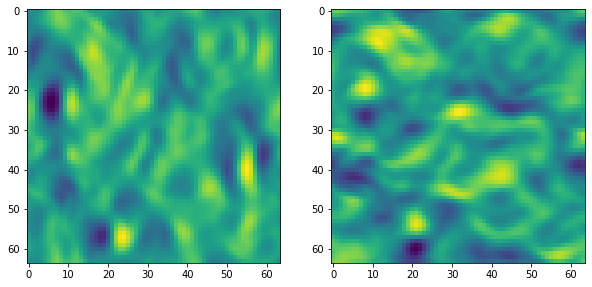

In [51]:
patch_ln = torch.arange(0, 1, 1/64)
print(patch_ln)
R = patch_ln.shape[0]
# make it square meshgrid
patch_sq = torch.stack(torch.meshgrid(patch_ln, patch_ln), dim=-1)
patch_sq = patch_sq.view(-1,2)

X = X_lr
R = int(X.shape[0]**0.5)
y = model(X)[0]
print(y.shape)

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(y.reshape(R,R,2).detach().cpu()[:,:,0])
plt.subplot(122)
plt.imshow(y.reshape(R,R,2).detach().cpu()[:,:,1])
plt.show()

X = patch_sq
R = int(X.shape[0]**0.5)
y = model(X)[0]
print(y.shape)

plt.figure(figsize=(10,5))
plt.subplot(121)
plt.imshow(y.reshape (R,R,2).detach().cpu()[:,:,0])
plt.subplot(122)
plt.imshow(y.reshape(R,R,2).detach().cpu()[:,:,1])
plt.show()


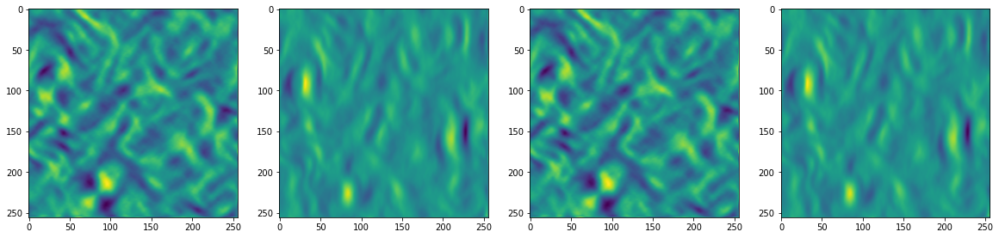

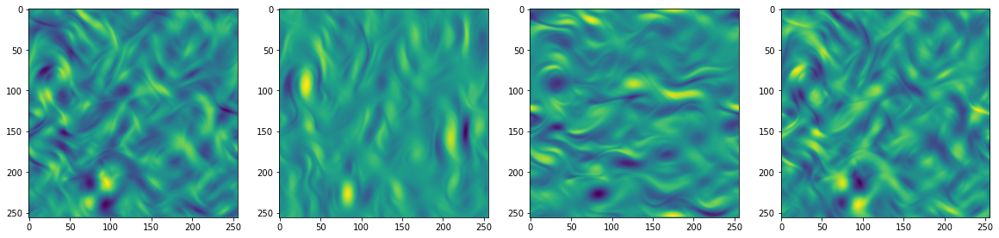

In [53]:
X = X_hr
R = int(X.shape[0]**0.5)

from kornia.filters import SpatialGradient
sp_grad = SpatialGradient(mode='sobel',normalized=True)

X.requires_grad_(True)
y = model(X)[0]
u, v = torch.split(y,1,-1)
du_xy = torch.autograd.grad(u, X, torch.ones_like(u), create_graph=True)[0] # Bx2 
dv_xy = torch.autograd.grad(v, X, torch.ones_like(v), create_graph=True)[0] # Bx2

plt.figure(figsize=(20,5))
plt.subplot(141)
plt.imshow(du_xy.reshape (R,R,2).detach().cpu()[:,:,0] / (R*2))
plt.subplot(142)
plt.imshow(du_xy.reshape(R,R,2).detach().cpu()[:,:,1] / (R*2))
plt.subplot(143)
plt.imshow(du_xy.reshape (R,R,2).detach().cpu()[:,:,0] / (R*2))
plt.subplot(144)
plt.imshow(du_xy.reshape(R,R,2).detach().cpu()[:,:,1] / (R*2))
plt.show()

y_img_hat = y_hr.view(R,R,2)[None,...].permute(0,3,1,2)
grads = sp_grad(y_img_hat) # Nx2x2xHxW

plt.figure(figsize=(20,5))
plt.subplot(141)
plt.imshow(grads[0,0,1,...].detach().numpy())
plt.subplot(142)
plt.imshow(grads[0,0,0,...].detach().numpy())
plt.subplot(143)
plt.imshow(grads[0,1,1,...].detach().numpy())
plt.subplot(144)
plt.imshow(grads[0,1,0,...].detach().numpy())
plt.show()

In [54]:
checkpoint_callback.best_model_path

'/home/dicarlo_d/Documents/Code/TurboSuperResultion/notebooks/.torch_checkpoints/Turb2D-RFFNet-epoch=459-val_loss=0.00-v2.ckpt'

In [55]:
# grads = '/home/dicarlo_d/Documents/Code/TurboSuperResultion/notebooks/.torch_checkpoints/Turb2D-RFFNet-epoch=1019-val_loss=0.01.ckpt'

torch.Size([4096, 2]) torch.Size([4096, 2])
torch.Size([65536, 2]) torch.Size([65536, 2])
torch.Size([4096, 2])
torch.Size([65536, 2])


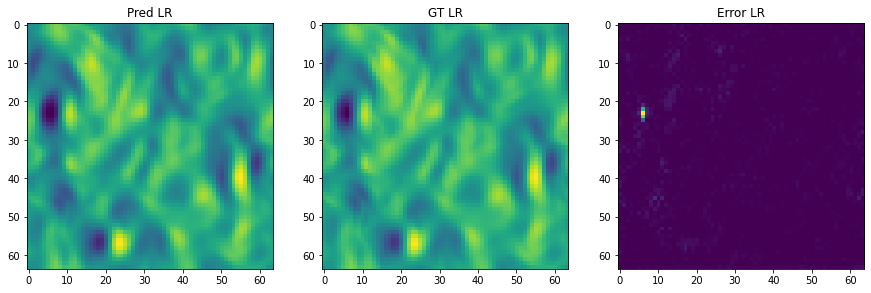

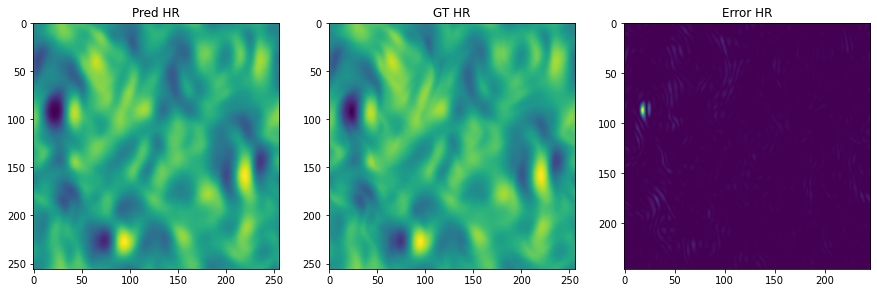

In [56]:
X_lr, y_lr = dm.val_dataset[:]
img_shape_lr = dm.val_dataset.img_shape[:2]
shape_lr = dm.val_dataset.img_shape

X_hr, y_hr = dm.test_dataset[:]
img_shape_hr = dm.test_dataset.img_shape[:2]
shape_hr = dm.test_dataset.img_shape

print(X_lr.shape, y_lr.shape)
print(X_hr.shape, y_hr.shape)

y_hat_lr, P_hat_lr = model(X_lr)
y_hat_hr, P_hat_hr = model(X_hr)

print(y_hat_lr.shape)
print(y_hat_hr.shape)

err_lr = torch.abs(y_hat_lr - y_lr)**2
err_hr = torch.abs(y_hat_hr - y_hr)**2

plt.figure(figsize=(15,5))
plt.subplot(131)
plt.title('Pred LR')
plt.imshow(y_hat_lr[:,0].reshape(*img_shape_lr).detach())
plt.subplot(132)
plt.title('GT LR')
plt.imshow(y_lr[:,0].reshape(*img_shape_lr).detach())
plt.subplot(133)
plt.title('Error LR')
plt.imshow(err_lr[:,0].reshape(*img_shape_lr).detach())
plt.show()

plt.figure(figsize=(15,5))
plt.subplot(131)
plt.title('Pred HR')
plt.imshow(y_hat_hr[:,0].reshape(*img_shape_hr).detach())
plt.subplot(132)
plt.title('GT HR')
plt.imshow(y_hr[:,0].reshape(*img_shape_hr).detach())
plt.subplot(133)
plt.title('Error HR')
plt.imshow(err_hr[:,0].reshape(*img_shape_hr)[5:-5,5:-5].detach())
plt.show()

if P_hat_hr is not None:
    plt.figure(figsize=(15,5))
    plt.subplot(121)
    plt.title('Pred LR')
    plt.imshow(P_hat_lr[:,0].reshape(*img_shape_lr).detach())
    plt.subplot(122)
    plt.title('GT LR')
    plt.imshow(P_hat_hr[:,0].reshape(*img_shape_hr).detach())
    plt.show()

In [57]:
from kornia.filters import SpatialGradient
sp_grad = SpatialGradient(mode='diff',normalized=True)

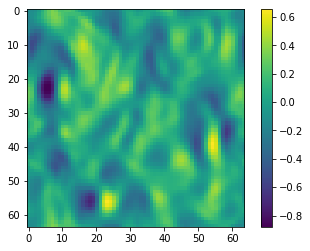

In [58]:
res = 64
x = torch.linspace(0, 1, res, device=model.device)
xx, xy = torch.meshgrid([x, x])
x = torch.cat([xx.flatten()[:,None], xy.flatten()[:,None]], dim=-1)
x.requires_grad_(True)
y_hat_off, _ = model.forward(x)

plt.imshow(y_hat_off[:,0].reshape(res,res).detach())
plt.colorbar()
plt.show()

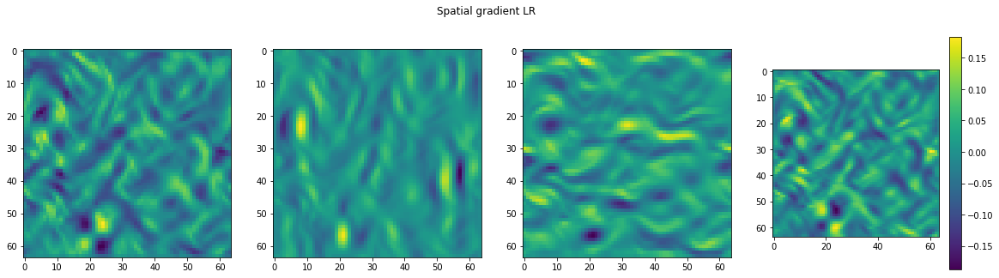

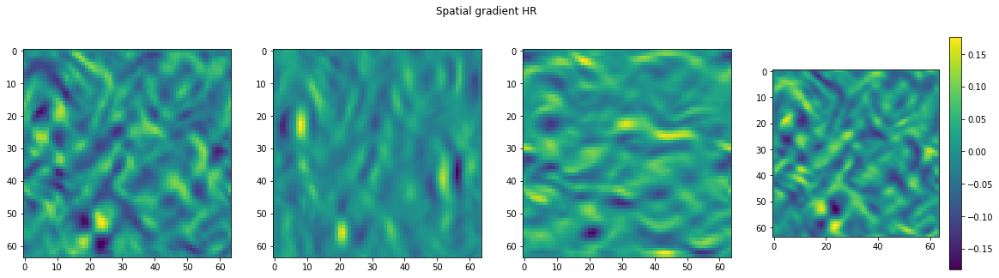

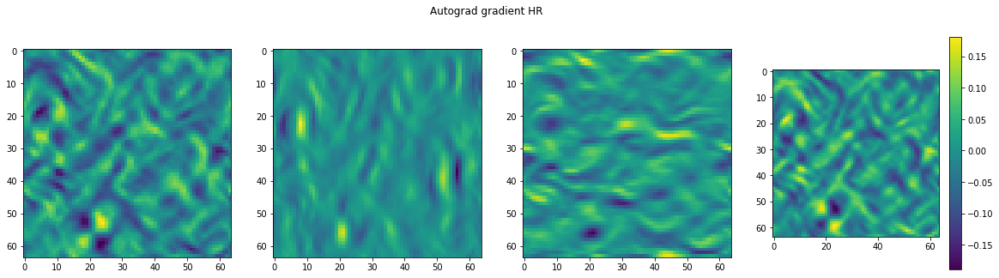

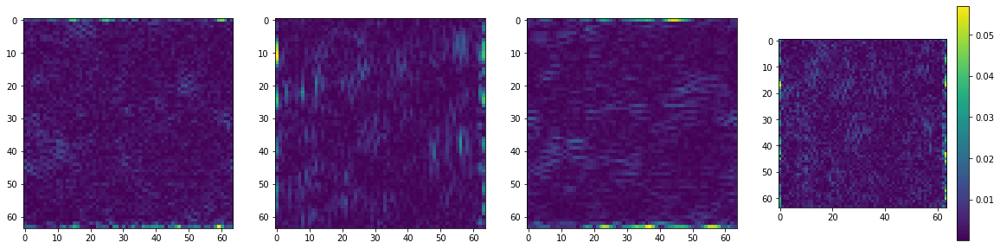

In [59]:
# compute the spatial gradient of the groundtruth
y_img_hat = y_lr.view(1,L,L,2).permute(0,3,1,2)
grads = sp_grad(y_img_hat)
img_u_x = grads[0,0,1,...] # we take this inverted as it was we are doing ij indexing
img_u_y = grads[0,0,0,...] # we take this inverted as it was we are doing ij indexing
img_v_x = grads[0,1,1,...] # we take this inverted as it was we are doing ij indexing
img_v_y = grads[0,1,0,...] # we take this inverted as it was we are doing ij indexing

plt.figure(figsize=(20,5))
plt.suptitle('Spatial gradient LR')
plt.subplot(141)
plt.imshow(img_u_x.detach())
plt.subplot(142)
plt.imshow(img_u_y.detach())
plt.subplot(143)
plt.imshow(img_v_x.detach())
plt.subplot(144)
plt.imshow(img_v_y.detach())
plt.colorbar()
plt.show()

# compute the spatial gradient of the prediction
y_img_hat = y_hat_off.view(1,res,res,2).permute(0,3,1,2)
grads = sp_grad(y_img_hat)
img_u_x = grads[0,0,1,...] # we take this inverted as it was we are doing ij indexing
img_u_y = grads[0,0,0,...] # we take this inverted as it was we are doing ij indexing
img_v_x = grads[0,1,1,...] # we take this inverted as it was we are doing ij indexing
img_v_y = grads[0,1,0,...] # we take this inverted as it was we are doing ij indexing

plt.figure(figsize=(20,5))
plt.suptitle('Spatial gradient HR')
plt.subplot(141)
plt.imshow(img_u_x.detach())
plt.subplot(142)
plt.imshow(img_u_y.detach())
plt.subplot(143)
plt.imshow(img_v_x.detach())
plt.subplot(144)
plt.imshow(img_v_y.detach())
plt.colorbar()
plt.show()

# compute the gradient of the prediction with autograd
u, v = torch.split(y_hat_off,1,-1)
du_xy = torch.autograd.grad(u, x, torch.ones_like(u), create_graph=True)[0]
dv_xy = torch.autograd.grad(v, x, torch.ones_like(v), create_graph=True)[0]

du_x = du_xy[:,0].reshape(res,res) / res
du_y = du_xy[:,1].reshape(res,res) / res
dv_x = dv_xy[:,0].reshape(res,res) / res
dv_y = dv_xy[:,1].reshape(res,res) / res

plt.figure(figsize=(20,5))
plt.suptitle('Autograd gradient HR')
plt.subplot(141)
plt.imshow(du_x.detach())
plt.subplot(142)
plt.imshow(du_y.detach())
plt.subplot(143)
plt.imshow(dv_x.detach())
plt.subplot(144)
plt.imshow(dv_y.detach())
plt.colorbar()
plt.show()

gdiff_u_x = torch.abs(img_u_x - du_x)**1
gdiff_u_y = torch.abs(img_u_y - du_y)**1
gdiff_v_x = torch.abs(img_v_x - dv_x)**1
gdiff_v_y = torch.abs(img_v_y - dv_y)**1

plt.figure(figsize=(20,5))
plt.subplot(141)
plt.imshow(gdiff_u_x.detach().cpu())
plt.subplot(142)
plt.imshow(gdiff_u_y.detach().cpu())
plt.subplot(143)
plt.imshow(gdiff_v_x.detach().cpu())
plt.subplot(144)
plt.imshow(gdiff_v_y.detach().cpu())
plt.colorbar()
plt.show()

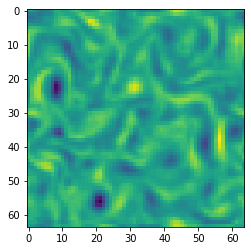

In [60]:
w = dv_x - du_y
plt.imshow(w.detach().cpu())

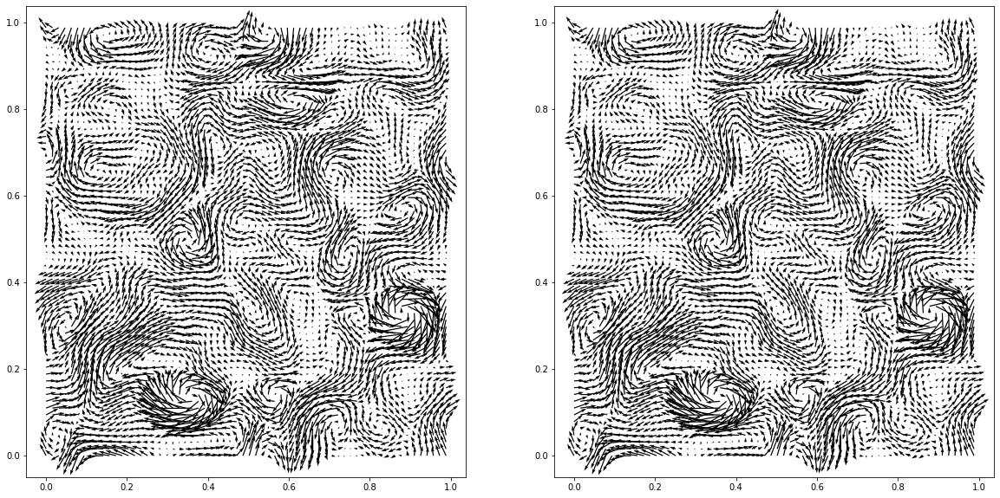

In [61]:
x = X_lr[:,0].detach()
y = X_lr[:,1].detach()
u = y_hat_lr[:,0].detach()
v = y_hat_lr[:,1].detach()

s = 1
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.quiver(x.reshape(*img_shape_lr)[::s,::s], 
           y.reshape(*img_shape_lr)[::s,::s],
           u.reshape(*img_shape_lr)[::s,::s],
           v.reshape(*img_shape_lr)[::s,::s], scale=10)
plt.subplot(122)
plt.quiver(        x.reshape(*img_shape_lr)[::s,::s], 
                   y.reshape(*img_shape_lr)[::s,::s],
           y_lr[:,0].reshape(*img_shape_lr)[::s,::s],
           y_lr[:,1].reshape(*img_shape_lr)[::s,::s], scale=10)

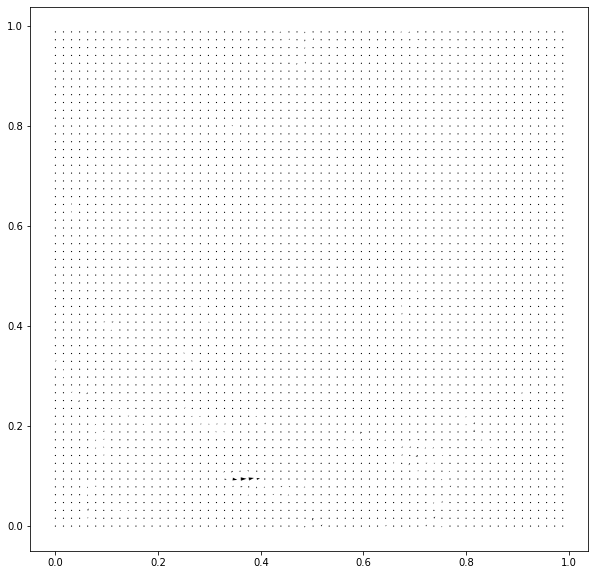

In [62]:
x = X_lr[:,0].detach()
y = X_lr[:,1].detach()
u_diff = y_hat_lr[:,0].detach() - y_lr[:,0].detach()
v_diff = y_hat_lr[:,1].detach() - y_lr[:,1].detach()

s = 1
plt.figure(figsize=(10,10))
plt.quiver(x.reshape(*img_shape_lr)[::s,::s], 
           y.reshape(*img_shape_lr)[::s,::s],
           u_diff.reshape(*img_shape_lr)[::s,::s],
           v_diff.reshape(*img_shape_lr)[::s,::s], scale=10)

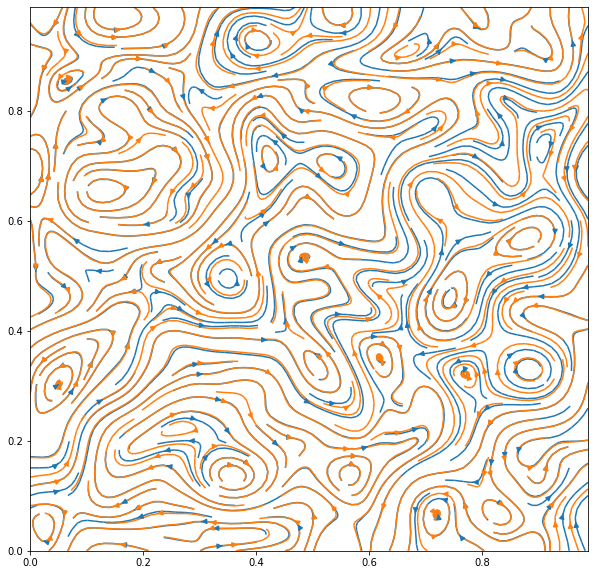

In [63]:
s = 1
plt.figure(figsize=(10,10))
plt.streamplot(        
           x.reshape(*img_shape_lr)[::s,::s].T.numpy(), 
           y.reshape(*img_shape_lr)[::s,::s].T.numpy(),
           y_lr[:,0].reshape(*img_shape_lr)[::s,::s].T.numpy(),
           y_lr[:,1].reshape(*img_shape_lr)[::s,::s].T.numpy(), density=2)
plt.streamplot(x.reshape(*img_shape_lr)[::s,::s].T.numpy(), 
           y.reshape(*img_shape_lr)[::s,::s].T.numpy(),
           u.reshape(*img_shape_lr)[::s,::s].T.numpy(),
           v.reshape(*img_shape_lr)[::s,::s].T.numpy(), density=2)

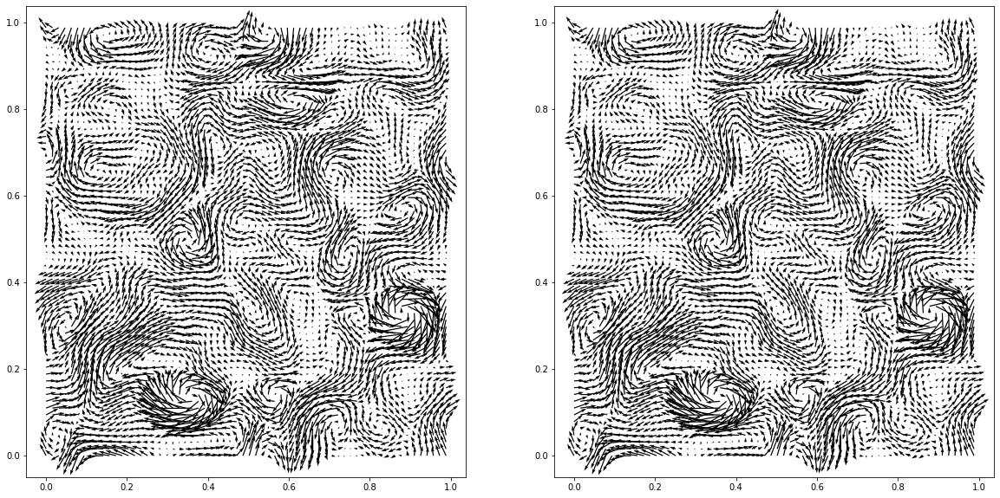

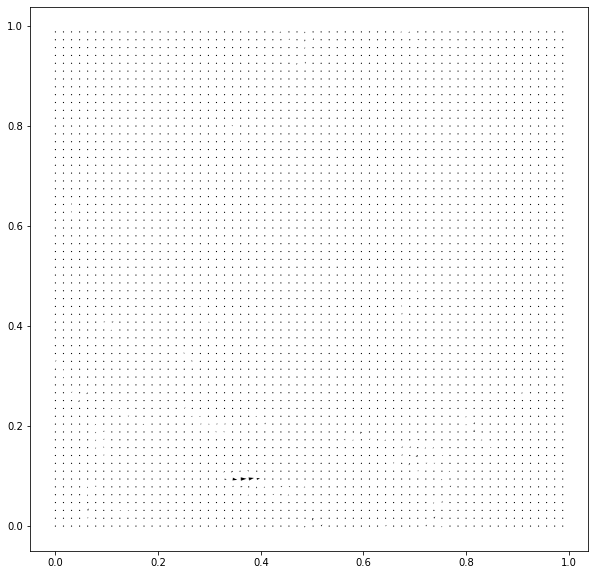

In [69]:
x = X_hr[:,0].detach()
y = X_hr[:,1].detach()
u = y_hat_hr[:,0].detach()
v = y_hat_hr[:,1].detach()

s = 4
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.quiver(x.reshape(*img_shape_hr)[::s,::s], 
           y.reshape(*img_shape_hr)[::s,::s],
           u.reshape(*img_shape_hr)[::s,::s],
           v.reshape(*img_shape_hr)[::s,::s], scale=10)
plt.subplot(122)
plt.quiver(        x.reshape(*img_shape_hr)[::s,::s], 
                   y.reshape(*img_shape_hr)[::s,::s],
           y_hr[:,0].reshape(*img_shape_hr)[::s,::s],
           y_hr[:,1].reshape(*img_shape_hr)[::s,::s], scale=10)


x = X_hr[:,0].detach()
y = X_hr[:,1].detach()
u_diff = y_hat_hr[:,0].detach() - y_hr[:,0].detach()
v_diff = y_hat_hr[:,1].detach() - y_hr[:,1].detach()

plt.figure(figsize=(10,10))
plt.quiver(x.reshape(*img_shape_hr)[::s,::s], 
           y.reshape(*img_shape_hr)[::s,::s],
           u_diff.reshape(*img_shape_hr)[::s,::s],
           v_diff.reshape(*img_shape_hr)[::s,::s], scale=10)
plt.show()

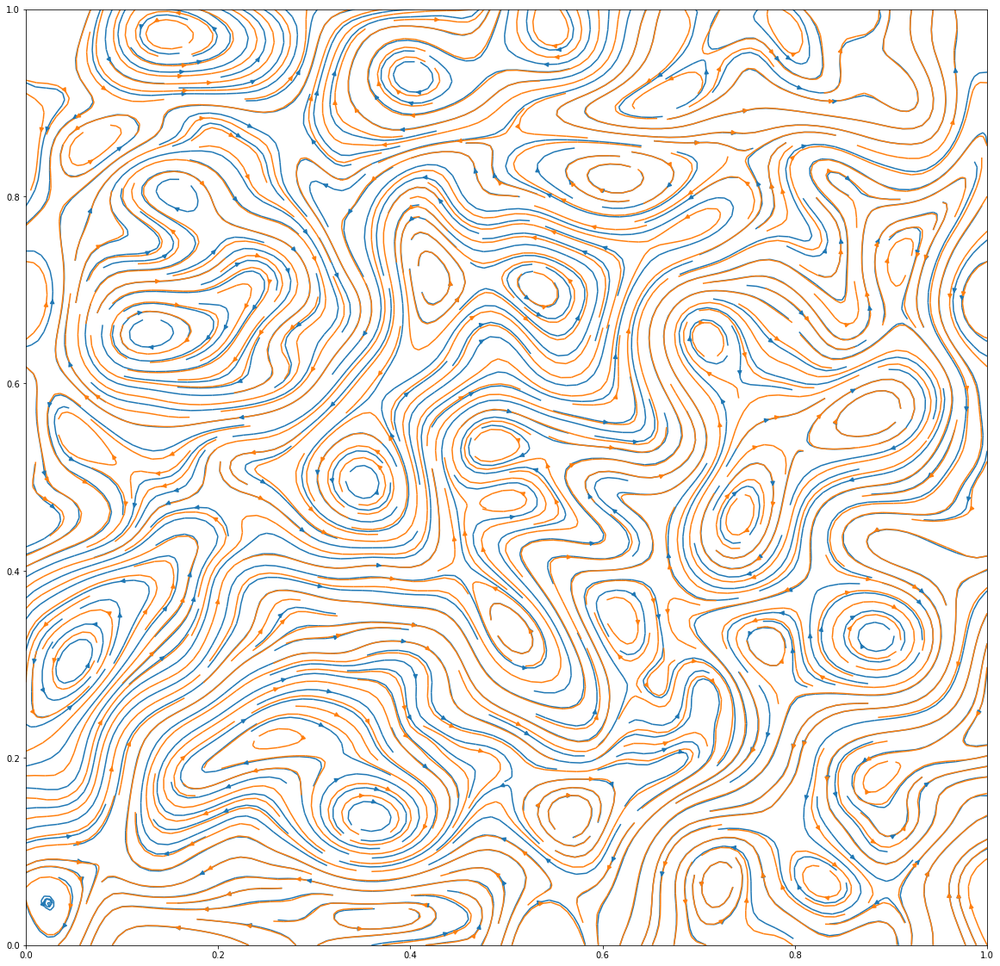

In [70]:
s = 1
plt.figure(figsize=(20,20))
plt.streamplot(
           x.reshape(*img_shape_hr)[::s,::s].T.numpy(), 
           y.reshape(*img_shape_hr)[::s,::s].T.numpy(),
           u.reshape(*img_shape_hr)[::s,::s].T.numpy(),
           v.reshape(*img_shape_hr)[::s,::s].T.numpy(),density=3)
plt.streamplot(        
           x.reshape(*img_shape_hr)[::s,::s].T.numpy(), 
           y.reshape(*img_shape_hr)[::s,::s].T.numpy(),
           y_hr[:,0].reshape(*img_shape_hr)[::s,::s].T.numpy(),
           y_hr[:,1].reshape(*img_shape_hr)[::s,::s].T.numpy(),density=3)

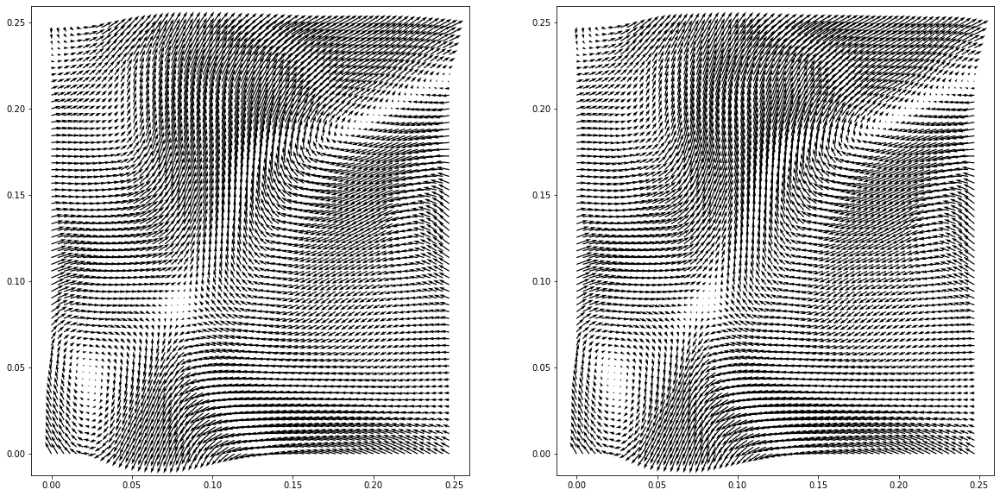

In [71]:
x = X_hr[:,0].detach()
y = X_hr[:,1].detach()
u = y_hat_hr[:,0].detach()
v = y_hat_hr[:,1].detach()

d = 1
l = 64
s = 10
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.quiver(x.reshape(*img_shape_hr)[:l:d,:l:d], 
           y.reshape(*img_shape_hr)[:l:d,:l:d],
           u.reshape(*img_shape_hr)[:l:d,:l:d],
           v.reshape(*img_shape_hr)[:l:d,:l:d], scale=s)
plt.subplot(122)
plt.quiver(        x.reshape(*img_shape_hr)[:l:d,:l:d], 
                   y.reshape(*img_shape_hr)[:l:d,:l:d],
           y_hr[:,0].reshape(*img_shape_hr)[:l:d,:l:d],
           y_hr[:,1].reshape(*img_shape_hr)[:l:d,:l:d], scale=s)

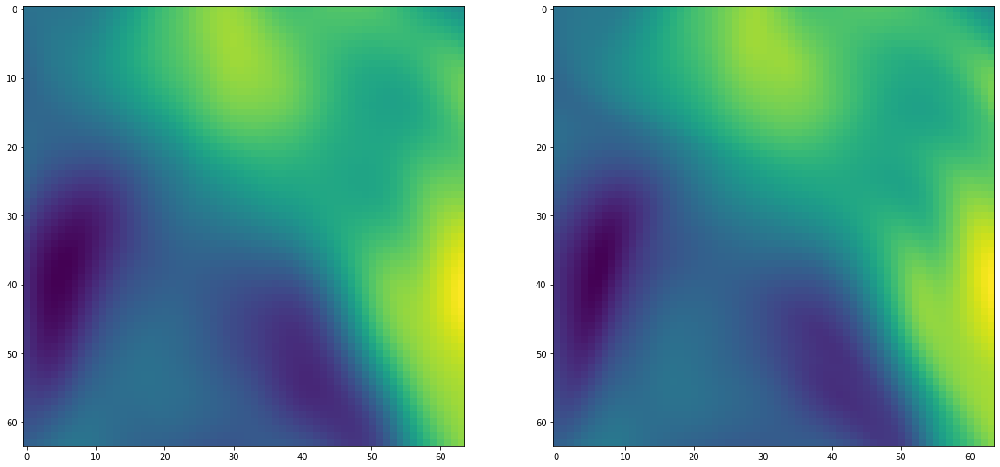

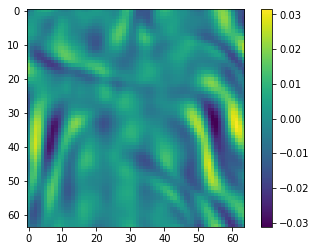

In [72]:
x = X_hr[:,0].detach()
y = X_hr[:,1].detach()
u = y_hat_hr[:,0].detach()
v = y_hat_hr[:,1].detach()

d = 1
l = 64
s = 10
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.imshow(u.reshape(*img_shape_hr)[:l:d,:l:d])
plt.subplot(122)
plt.imshow(y_hr[:,0].reshape(*img_shape_hr)[:l:d,:l:d])
plt.show()
plt.imshow((y_hr[:,0]-u).reshape(*img_shape_hr)[:l:d,:l:d])
plt.colorbar()

In [ ]:
print(compute_all_metrics(y_hat_lr, y_lr))
print(compute_all_metrics(y_hat_hr, y_hr))

In [ ]:
# compute spectrum
spec_ns = phy.energy_spectrum(torch.randn(*shape_hr).permute(2,0,1))[0]
spec_lr = phy.energy_spectrum(y_lr.view(*shape_lr).permute(2,0,1))[0]
spec_hr = phy.energy_spectrum(y_hr.view(*shape_hr).permute(2,0,1))[0]

spec_lr_pred = phy.energy_spectrum(y_hat_lr.view(*shape_lr).permute(2,0,1))[0]
spec_hr_pred = phy.energy_spectrum(y_hat_hr.view(*shape_hr).permute(2,0,1))[0]

# plt.loglog(spec_ns)
plt.loglog(spec_lr)
plt.loglog(spec_hr)
plt.loglog(spec_lr_pred.detach())
plt.loglog(spec_hr_pred.detach())


In [ ]:
# spec error
spec_log_error_lr = torch.norm(torch.log(spec_lr_pred+1e-20) - torch.log(spec_lr+1e-20))**2
spec_log_error_hr = torch.norm(torch.log(spec_hr_pred+1e-20) - torch.log(spec_hr+1e-20))**2

print(spec_error_lr.item())
print(spec_error_hr.item())

In [ ]:
# angular error
def ang_error(x, x_ref, avg=True):
    assert x.shape == x_ref.shape
    assert x.shape[1] == 2
    N = x.shape[0]
    
    w1 = torch.cat([x, torch.ones(x.shape[0], 1)], dim=1)
    w2 = torch.cat([x_ref, torch.ones(x_ref.shape[0], 1)], dim=1)
    
    err = torch.sum(w1 * w2, dim=1) / (torch.norm(w1, dim=1) * torch.norm(w2, dim=1))
    assert err.sum() < N
    err = torch.rad2deg(torch.acos(err))
    if avg:
        return err.mean()
    return err
    

ang_err_lr = ang_error(y_lr, y_hat_lr, avg=True)
ang_err_hr = ang_error(y_hr, y_hat_hr, avg=True)

print(torch.max(ang_error(y_lr, y_hat_lr, avg=False)))
print(torch.max(ang_error(y_hr, y_hat_hr, avg=False)))


In [ ]:
model = plDivFreeRFFNet.load_from_checkpoint(checkpoint_callback.best_model_path)
trainer.test(model, dm)

In [ ]:
spec_lr_err = phy.energy_spectrum(((y_hat_lr-y_lr)**2).view(*img_shape_lr).permute(2,0,1))[0]
spec_hr_err = phy.energy_spectrum(((y_hat_hr-y_hr)**2).view(*img_shape_hr).permute(2,0,1))[0]

plt.loglog(spec_lr_err.detach())
plt.loglog(spec_hr_err.detach())

In [ ]:
y_hat, Py_hat = model(X_lr)
u, v = torch.split(y_hat,1,-1)
du_xy = torch.autograd.grad(u, X_lr, torch.ones_like(u), create_graph=True)[0]       
dv_xy = torch.autograd.grad(v, X_lr, torch.ones_like(v), create_graph=True)[0]
# div_autograd = du_xy[...,0] + dv_xy[...,1]
div_autograd = dv_xy[...,1]
div_autograd = div_autograd.view(*img_shape_lr[:2])

plt.imshow(div_autograd.detach())
plt.colorbar()
plt.show()

du_x = tch._my_field_grad(y_hat.view(*img_shape_lr)[:,:,0], 1)
du_y = tch._my_field_grad(y_hat.view(*img_shape_lr)[:,:,1], 0)
div_numerical = du_y
    
plt.imshow(div_numerical.detach())
plt.colorbar()
plt.show()

plt.imshow((div_numerical - div_autograd).detach())
plt.colorbar()
plt.show()


In [ ]:
y_hat, Py_hat = model(X_hr)
u, v = torch.split(y_hat,1,-1)
du_xy = torch.autograd.grad(u, X_hr, torch.ones_like(u), create_graph=True)[0]       
dv_xy = torch.autograd.grad(v, X_hr, torch.ones_like(v), create_graph=True)[0]
# div_autograd = du_xy[...,0] + dv_xy[...,1]
div_autograd = dv_xy[...,1]
div_autograd = div_autograd.view(*img_shape_hr[:2])

plt.imshow(div_autograd[2:-2,2:-2].detach())
plt.colorbar()
plt.show()

du_x = tch._my_field_grad(y_hat.view(*img_shape_hr)[:,:,0], 1)
du_y = tch._my_field_grad(y_hat.view(*img_shape_hr)[:,:,1], 0)
div_numerical = du_y
    
plt.imshow(div_numerical[2:-2,2:-2].detach())
plt.colorbar()
plt.show()

plt.imshow((div_numerical[2:-2,2:-2] - div_autograd[2:-2,2:-2]).detach())
plt.colorbar()
plt.show()
